## Import Libraries

In [3]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy.stats import norm
from scipy import stats
from matplotlib_venn import venn3
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report

## Define Functions

In [5]:
def inputQC_predicts(df, input_columns, output_columns):
    # Define input and output variables
    inputs = df[input_columns]
    outputs = output_columns
    
    # Analysis for each output
    for output in outputs:
        print(f"### Analysis for {output} ###")
        
        # Fit a Logistic Regression Model
        model = LogisticRegression()
        model.fit(inputs, df[output])
        
        # Print model coefficients
        print("Coefficients:", model.coef_)
        print("Intercept:", model.intercept_)
        
        # Predict using the model
        predictions = model.predict(inputs)
    
        # Confusion matrix and classification report
        cm = confusion_matrix(df[output], predictions)
        print("Confusion Matrix:\n", cm)
        print("Classification Report:\n", classification_report(df[output], predictions))
    
        # Visualize with each inputs
        for input_var in inputs.columns:
            plt.figure(figsize=(10, 6))
            sns.boxplot(data=df, x=output, y=input_var, color='lightgreen')
            plt.title(f'Boxplot of {input_var} by {output} Status')
            plt.xlabel(output)
            plt.ylabel(f'{input_var} Values')
            plt.show()

## Define File Path

In [9]:
path = "/Users/davneetkaur/Downloads/seq_QC_data/"
file_name = "SEQ_00001.txt"
trial = pd.read_csv(path+file_name, sep = '\t')

### I've identified that the text file is tab separated. The import above successfully partitions the data into the appropriate cells. I can now apply this import function to all of the files:

In [12]:
trial

,barcode,sample_type,frag_size,pre_quant,post_quant,coverage,CNV_calling,passed_well
0,11003983829384,blood,617,44.266,565.101,passed,passed,passed
1,11006875693894,blood,605,46.289,540.586,passed,passed,passed
2,11004739959773,blood,540,40.270,575.035,passed,passed,passed
3,11004651860473,blood,618,42.925,560.410,passed,passed,passed
4,55000241940904,saliva,518,39.455,573.351,passed,passed,passed
...,...,...,...,...,...,...,...,...
91,11001871957909,blood,560,33.527,539.751,passed,passed,passed
92,55003649840225,saliva,437,34.219,549.954,passed,passed,passed
93,55001048449192,saliva,572,48.351,566.850,passed,passed,passed
94,55005001473666,saliva,479,42.718,551.074,passed,passed,passed


## Import all the text files into one dataframe.
### Each file is identified by a value in 'Seq_run' extracted from its name

In [15]:
df_list = []  # List to hold individual DataFrames

# Loop through files in the specified path
for file_name in os.listdir(path):
    if file_name.startswith('SEQ_') and file_name.endswith('.txt'):
        # Extract the number from the file name
        sequence_number = file_name[6:9]  # Assuming 'SEQ_0xxx.txt': index from 4 to 7
        
        # Read the file into a DataFrame, using the first row as header
        temp_df = pd.read_csv(os.path.join(path, file_name), sep='\t', header=0)  # Adjust 'sep' as needed
                
        # Add the 'Sequence' column with the extracted number
        temp_df['Seq_run'] = int(sequence_number)
        
        # Append the temporary DataFrame to the list
        df_list.append(temp_df)

# Concatenate all DataFrames into a single DataFrame
df = pd.concat(df_list, ignore_index=True)

# Display the combined DataFrame
df

,barcode,sample_type,post_quant,pre_quant,frag_size,coverage,CNV_calling,passed_well,Seq_run
0,11004698749673,blood,514.341,29.735,490,passed,passed,passed,159
1,11001562083941,blood,545.923,44.033,540,passed,failed,passed,159
2,11001052645509,blood,494.978,36.655,382,passed,passed,passed,159
3,11000133551257,blood,509.948,33.798,398,passed,passed,passed,159
4,11008488812909,blood,517.289,27.969,370,passed,passed,passed,159
...,...,...,...,...,...,...,...,...,...
28795,11001999607052,blood,618.531,49.704,400,passed,passed,passed,154
28796,11009924936741,blood,594.792,46.188,479,passed,passed,passed,154
28797,11000017285263,blood,623.359,46.288,489,passed,passed,passed,154
28798,11009865784614,blood,547.914,48.088,513,passed,failed,passed,154


## Data Inspection

array([[<Axes: title={'center': 'barcode'}>,
        <Axes: title={'center': 'post_quant'}>],
       [<Axes: title={'center': 'pre_quant'}>,
        <Axes: title={'center': 'frag_size'}>],
       [<Axes: title={'center': 'Seq_run'}>, <Axes: >]], dtype=object)

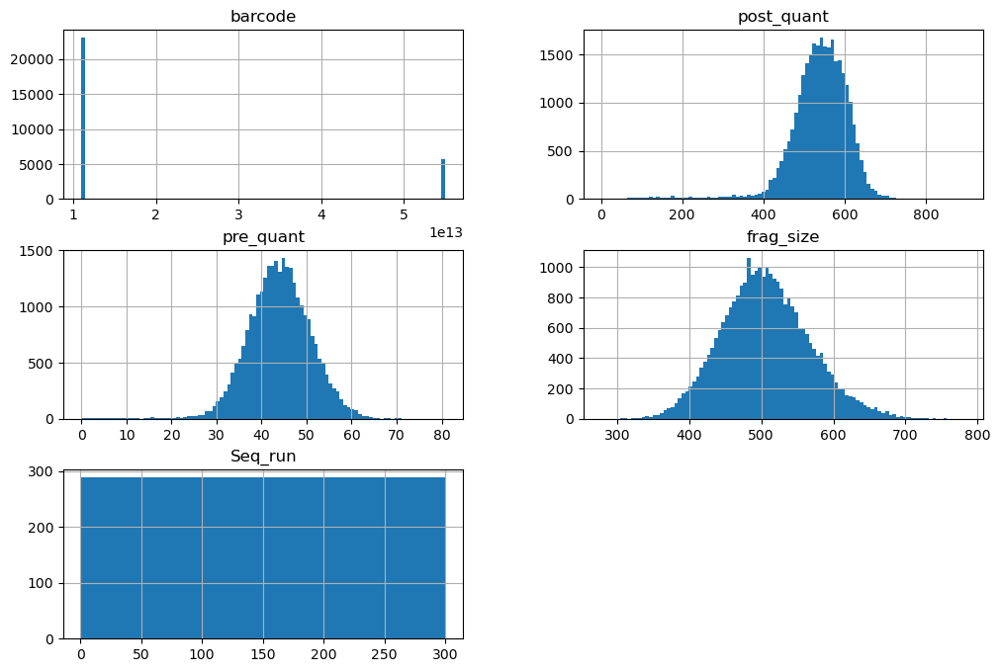

In [18]:
df.hist(bins=100, figsize = (12,8))

### The barcodes are all uniquely identifying:

In [21]:
unique_barcodes = df['barcode'].nunique()
if len(df) == unique_barcodes:
    print('All of the barcodes are uniquely identifying')

All of the barcodes are uniquely identifying


In [23]:
df.describe()

,barcode,post_quant,pre_quant,frag_size,Seq_run
count,2.880000e+04,28800.000000,28800.000000,28800.000000,28800.000000
mean,1.981720e+13,536.622083,43.912016,506.099132,150.500000
std,1.760949e+13,76.881511,7.135539,61.272523,86.603563
min,1.100000e+13,1.027000,0.015000,278.000000,1.000000
25%,1.100310e+13,501.966000,39.490750,464.000000,75.750000
50%,1.100617e+13,543.755500,43.985000,504.000000,150.500000
75%,1.100937e+13,585.058000,48.489250,545.000000,225.250000
max,5.501000e+13,896.575000,80.779000,783.000000,300.000000


### No cell values are missing throughout the entire dataset:

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28800 entries, 0 to 28799
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   barcode      28800 non-null  int64  
 1   sample_type  28800 non-null  object 
 2   post_quant   28800 non-null  float64
 3   pre_quant    28800 non-null  float64
 4   frag_size    28800 non-null  int64  
 5   coverage     28800 non-null  object 
 6   CNV_calling  28800 non-null  object 
 7   passed_well  28800 non-null  object 
 8   Seq_run      28800 non-null  int64  
dtypes: float64(2), int64(3), object(4)
memory usage: 2.0+ MB


## Converting some variables to binary and adding a few ratios which may be useful

In [29]:
# The ratio of post and pre quant DNA concentration
df['podivpre'] = df['post_quant']/df['pre_quant']

# The pre-quant [DNA] divided by fragment size, should scale with the number of molecules
df['molecules'] = df['pre_quant']/df['frag_size']

# Convert outputs to binary (1 for 'passed' and 0 for 'failed')
df['coverage_binary'] = (df['coverage'] == 'passed').astype(int)
df['CNV_calling_binary'] = (df['CNV_calling'] == 'passed').astype(int)
df['passed_well_binary'] = (df['passed_well'] == 'passed').astype(int)
df['sample_type_binary'] = (df['sample_type'] == 'blood').astype(int)

# Create sets for each output
set_coverage = set(df.index[df['coverage_binary'] == 1])
set_coverage_fail = set(df.index[df['coverage_binary'] == 0])
set_CNV_calling = set(df.index[df['CNV_calling_binary'] == 1])
set_CNV_calling_fail = set(df.index[df['CNV_calling_binary'] == 0])
set_passed_well = set(df.index[df['passed_well_binary'] == 1])
set_passed_well_fail = set(df.index[df['passed_well_binary'] == 0])

## CNV, Coverage, and Passed well Pass/Fail Summary and Venn diagram:
### - The wells that fail coverage and fail the 'passed well' category perfectly overlap (357 wells).
### - All of these failed wells also failed CNV calling.
### - However, 1797 wells failed CNV calling. So an additional 1440 wells that failed CNV calling, but not coverage.

In [32]:
df = df.sort_values(by='Seq_run', ascending=True).reset_index(drop=True)
print('Number of coverage fails = ' + str(df['coverage'].str.count('failed').sum()))
print('Number of CNV_calling fails = ' + str(df['CNV_calling'].str.count('failed').sum()))
print('Number of passed_well fails = ' + str(df['passed_well'].str.count('failed').sum()))
print('Fail both CNV_calling and  passed_well = ' + str(len(df[(df['CNV_calling'] =='failed') & (df['passed_well'] =='failed')])))
print('Fail both coverage and  passed_well = ' + str(len(df[(df['coverage'] =='failed') & (df['passed_well'] =='failed')])))

Number of coverage fails = 357
Number of CNV_calling fails = 1797
Number of passed_well fails = 357
Fail both CNV_calling and  passed_well = 357
Fail both coverage and  passed_well = 357


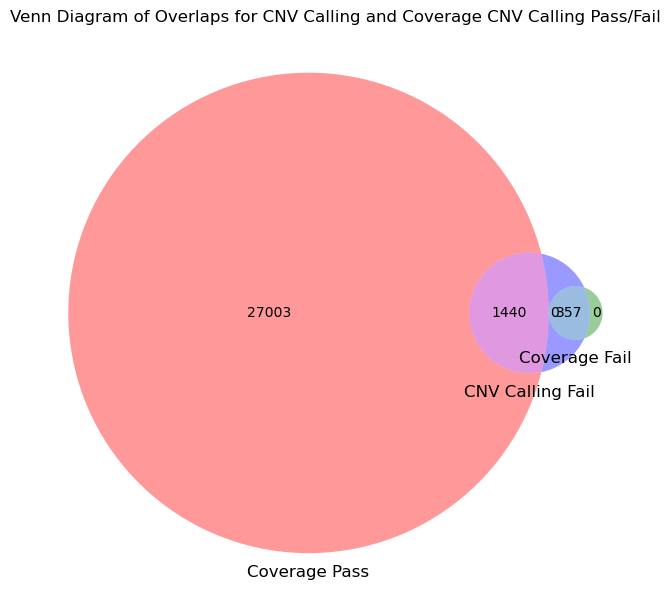

In [34]:
# Create a Venn diagram for the sets
plt.figure(figsize=(8, 8))
#venn3([set_coverage,set_coverage_fail, set_CNV_calling, set_CNV_calling_fail, set_passed_well, set_passed_well_fail], ('Coverage','Coverage Fail', 'CNV Calling','CNV Calling Fail', 'Passed Well', 'Passed Well Fail'))
#venn3([set_coverage, set_coverage_fail], ('Coverage','Coverage Fail'))
venn3([set_coverage, set_coverage_fail, set_CNV_calling_fail], ('Coverage Pass','Coverage Fail', 'CNV Calling Fail'))
# Set title and show the plot
plt.title('Venn Diagram of Overlaps for CNV Calling and Coverage CNV Calling Pass/Fail')
plt.show()

## **PART 1A)i) Which in-process QC metrics are indicative of failing sequencing due to low coverage?**
### --> Removing the wells that fail CNV calling only while passing coverage calling

In [37]:
df_CNV_failed = df[(df['CNV_calling_binary']==0)] 
df_CNV_passed_cov_fail = df[(df['CNV_calling_binary']==1) | (df['coverage_binary']==0)] 
df_coverage_passed = df[df['coverage_binary']==1]

## Answer: **Post Quantification DNA Concentration** is the in-process QC metric that's  indicative of failing sequencing due to low coverage.
### The post_quant variable separates the coverage calling (fail / pass) data perfectly as is demonstrated by the the confusion matrix I find below.
## -> There's a lower cut-off on the post_quant DNA concentration, below which the coverage QC fails

### Analysis for coverage_binary ###
Coefficients: [[0.21934492 0.27670408 0.01016144]]
Intercept: [-93.78428908]
Confusion Matrix:
 [[  357     0]
 [    0 27003]]
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       357
           1       1.00      1.00      1.00     27003

    accuracy                           1.00     27360
   macro avg       1.00      1.00      1.00     27360
weighted avg       1.00      1.00      1.00     27360



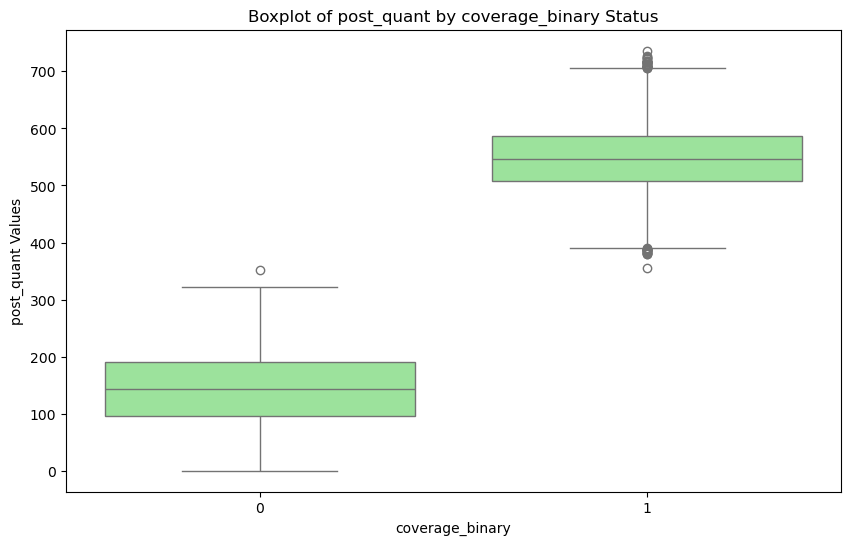

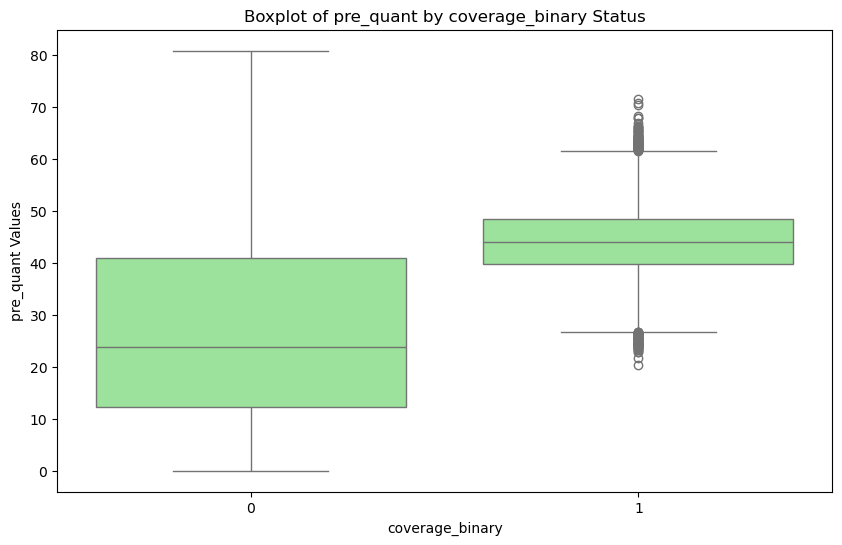

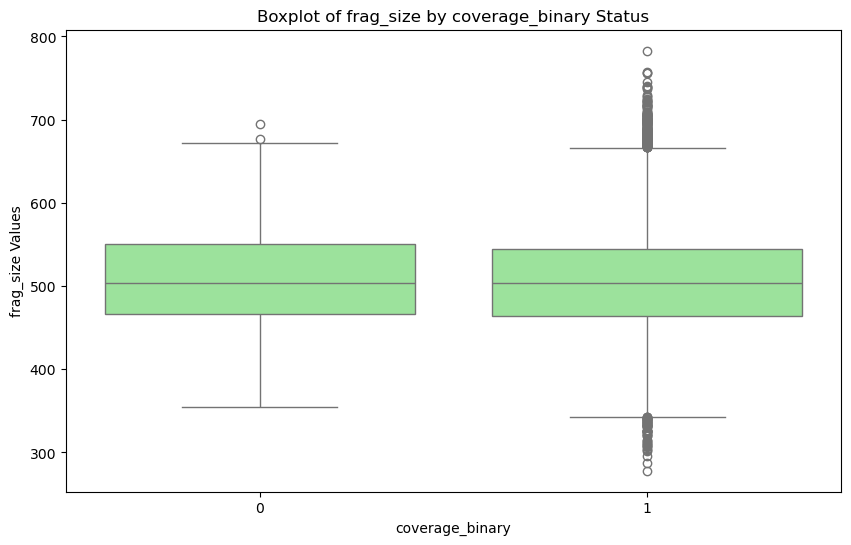

In [40]:
inputQC_predicts(df_CNV_passed_cov_fail, ['post_quant', 'pre_quant', 'frag_size'], ['coverage_binary'])

## --> _**The pass/fail post_quant DNA concentration cut-off is between 351.464 and 356.274**_

In [43]:
## Highest coverage failed post quant DNA concentration
print('Highest coverage failed post quant DNA concentration: ' + str(df_CNV_passed_cov_fail[df_CNV_passed_cov_fail['coverage_binary']==0]['post_quant'].max()))
## Lowest coverage passed post quant DNA concentration
print('Lowest coverage passed post quant DNA concentration: ' + str(df_CNV_passed_cov_fail[df_CNV_passed_cov_fail['coverage_binary']==1]['post_quant'].min()))

Highest coverage failed post quant DNA concentration: 351.464
Lowest coverage passed post quant DNA concentration: 356.274


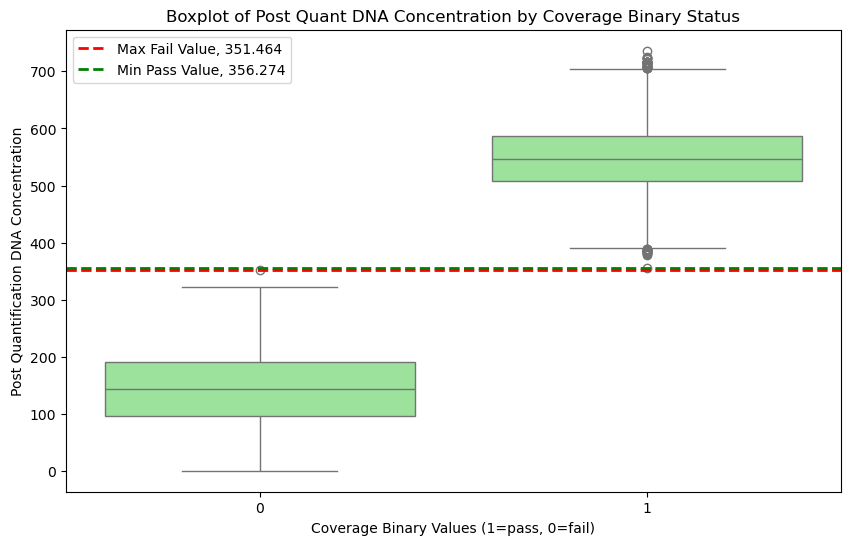

In [45]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_CNV_passed_cov_fail, x='coverage_binary', y='post_quant', color='lightgreen')

max_fail_value = df_CNV_passed_cov_fail[df_CNV_passed_cov_fail['coverage_binary'] == 0]['post_quant'].max()
plt.axhline(max_fail_value, color='red', linestyle='dashed', linewidth=2, label=f'Max Fail Value, {max_fail_value}')

min_pass_value = df_CNV_passed_cov_fail[df_CNV_passed_cov_fail['coverage_binary'] == 1]['post_quant'].min()
plt.axhline(min_pass_value, color='green', linestyle='dashed', linewidth=2, label=f'Min Pass Value, {min_pass_value}')

plt.title(f'Boxplot of Post Quant DNA Concentration by Coverage Binary Status')
plt.xlabel('Coverage Binary Values (1=pass, 0=fail)')
plt.ylabel('Post Quantification DNA Concentration')
plt.legend()
plt.savefig('Post_quant_predicts_coverage.png', dpi=500, bbox_inches='tight')  # Save as PNG
plt.show()

## **PART 1A)ii) Which metrics are indicative of passing coverage but failing CNV calling?**

### Considering just the coverage passing data and checking which metric distinguishes the CNV-calling pass/fail data
#### --> The 'post_quant', 'pre_quant', 'frag_size', sample type, and barcode  **do not distinguish** the CNV-calling pass/fail data
#### --> Of these, post_quant most strongly correlate with CNV-calling

### Analysis for CNV_calling_binary ###
Coefficients: [[0.0209991  0.00836744 0.0005684 ]]
Intercept: [-8.33193442]
Confusion Matrix:
 [[  348  1092]
 [    1 27002]]
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.24      0.39      1440
           1       0.96      1.00      0.98     27003

    accuracy                           0.96     28443
   macro avg       0.98      0.62      0.68     28443
weighted avg       0.96      0.96      0.95     28443



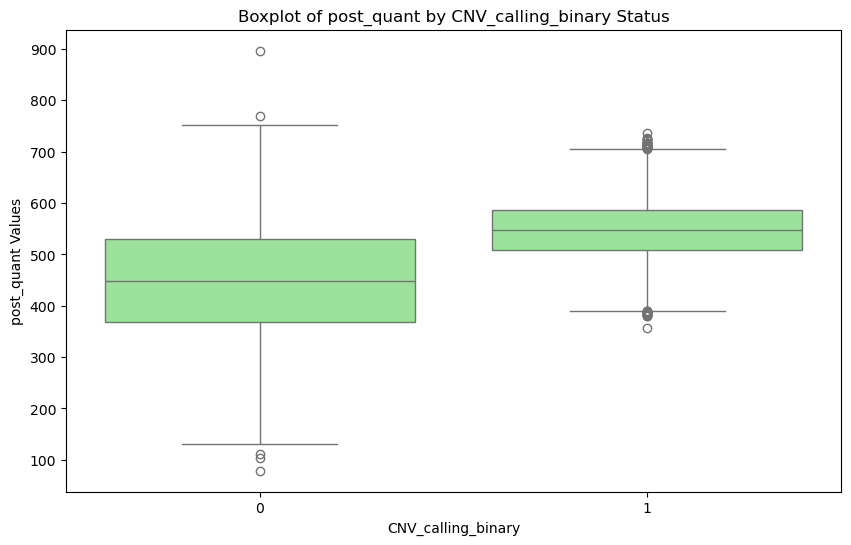

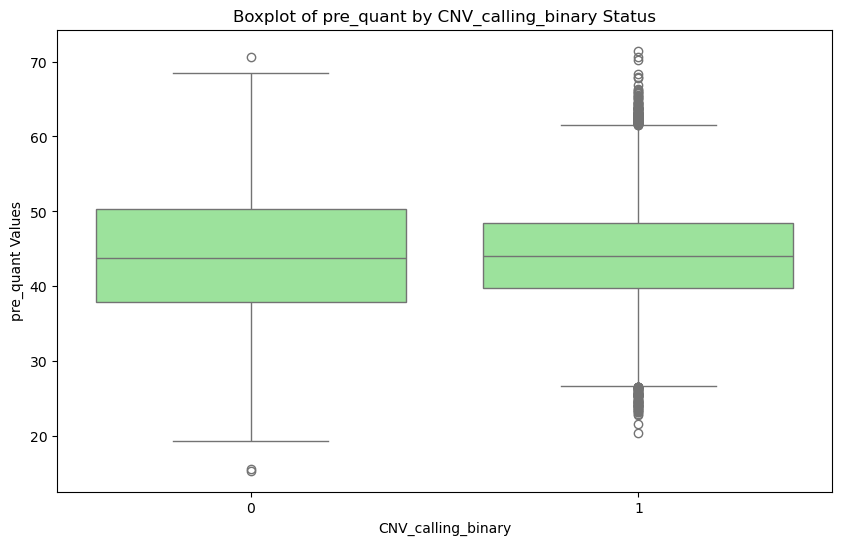

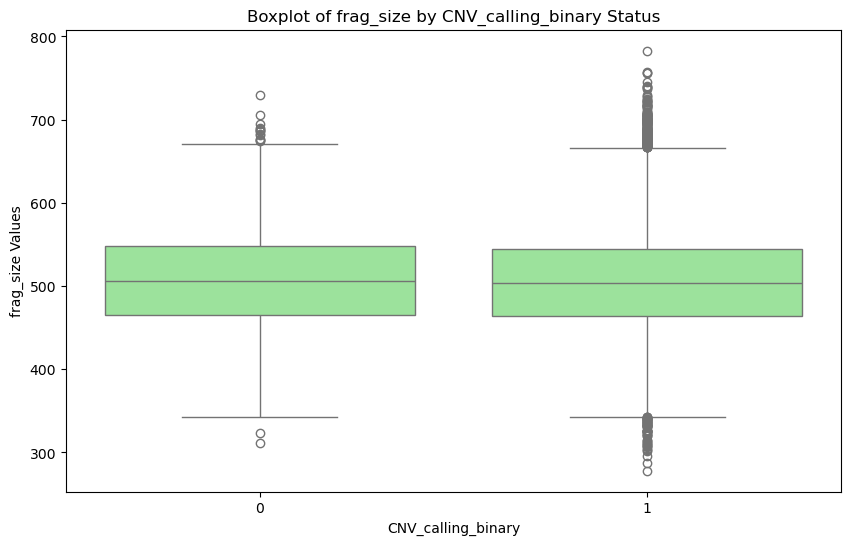

In [49]:
## Data that passed coverage:
df_cov_passed= df[(df['coverage_binary']==1)]
## Data that passed coverage and passed CNV calling:
df_cov_passed_CNV_passed = df[(df['CNV_calling_binary']==1) & (df['coverage_binary']==1)]
## Data that passed coverage but failed CNV calling:
df_cov_passed_CNV_failed = df[(df['CNV_calling_binary']==0) & (df['coverage_binary']==1)]

#The best fit with in-process metrics
#'sample_type_binary','barcode' correlate with each other but worsen the regression

inputQC_predicts(df_cov_passed, ['post_quant', 'pre_quant', 'frag_size'], ['CNV_calling_binary'])

### Since none of the in-process QC metrics segment the data into pass/fail CNV-calling data, I find a few educated combinations of the metrics based on my knowledge of PCR reactions and the distribution of the efficiencies

In [52]:
## Assuming we have a single PCR reaction with a single target in each well I make a very rough estimation of the approximate cycle number

# I don't have the ligation adapter and poly(A) size / MW, so I approximate the ratio of the number molecules at the beginning and end of
# the reaction (Nt/No) by the ratio of the post-quant and pre-quant DNA concentrations

# These points will be distributed around the actual number of cycles since the efficiency of the reactions will be distributed
# with a peak below but near 1 --> The cycle number estimate is 4

df['approx_cycle_num'] = np.log2(df['podivpre'])

df['eff'] = ((df['podivpre'])**(1/4)) -1 ## Finding a cycle number of 4 and making the same assumption above in lieu of adapter size

Text(0.5, 1.0, 'Histogram of approx_cycle_num')

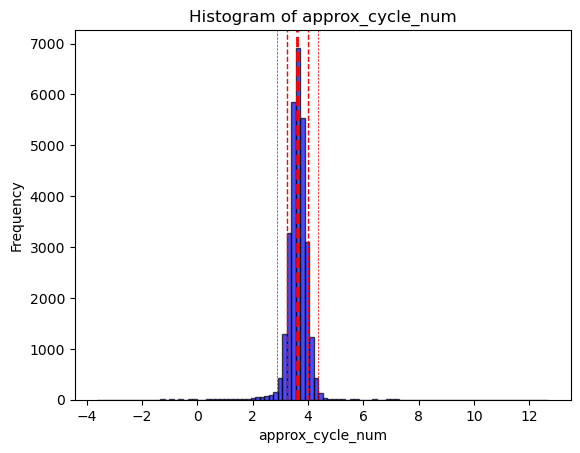

In [54]:
plt.hist(df['approx_cycle_num'], bins=100, color='blue', alpha=0.7, edgecolor='black')
plt.axvline(df['approx_cycle_num'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.axvline(df['approx_cycle_num'].mean()+df['approx_cycle_num'].std(), color='red', linestyle='dashed', linewidth=1)
plt.axvline(df['approx_cycle_num'].mean()-df['approx_cycle_num'].std(), color='red', linestyle='dashed', linewidth=1)
plt.axvline(df['approx_cycle_num'].mean()+2*df['approx_cycle_num'].std(), color='red', linestyle='dashed', linewidth=0.5)
plt.axvline(df['approx_cycle_num'].mean()-2*df['approx_cycle_num'].std(), color='red', linestyle='dashed', linewidth=0.5)
#plt.axvline(3, color='red', linestyle='dashed', linewidth=2)
plt.xlabel('approx_cycle_num')
plt.ylabel('Frequency')
plt.title('Histogram of approx_cycle_num')

### Efficiency, approx_cycle_num, and podivpre aren't as good metrics as post_quant for indication that a well passes coverage but fails CNV calling

### Analysis for CNV_calling_binary ###
Coefficients: [[ 5.05483378 10.88409089 -1.22114345]]
Intercept: [-25.2778019]
Confusion Matrix:
 [[  224  1216]
 [   26 26977]]
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.16      0.27      1440
           1       0.96      1.00      0.98     27003

    accuracy                           0.96     28443
   macro avg       0.93      0.58      0.62     28443
weighted avg       0.95      0.96      0.94     28443



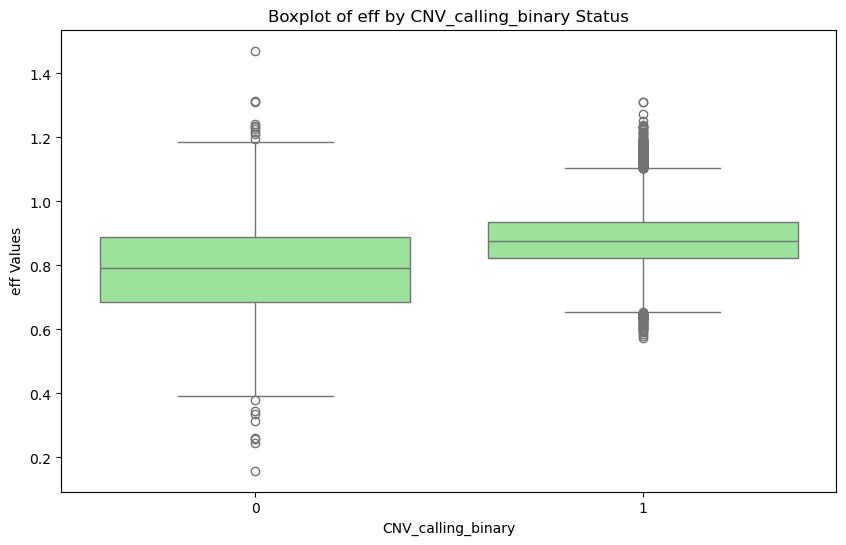

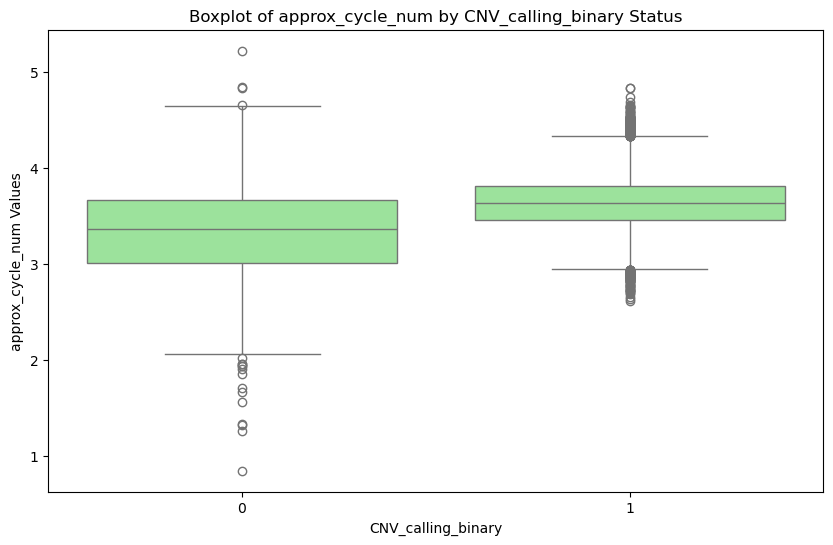

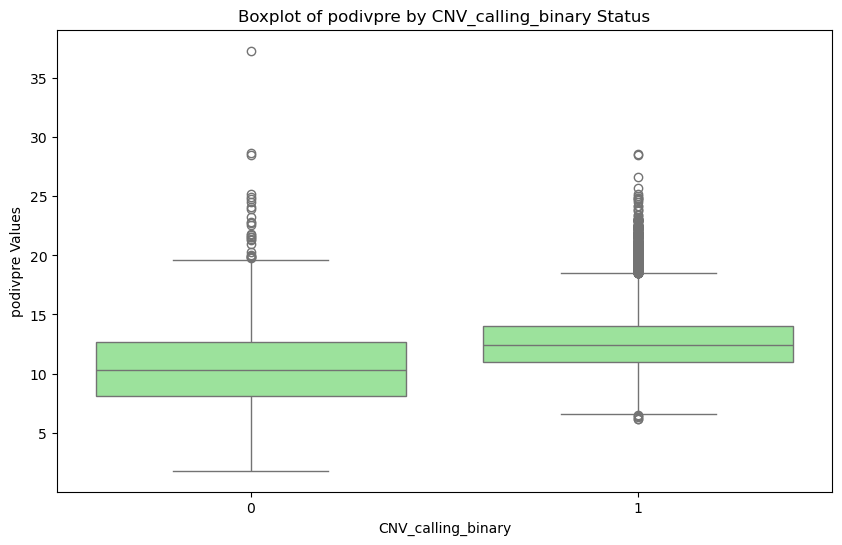

In [57]:
df_cov_passed= df[(df['coverage_binary']==1)]
df_cov_passed_CNV_passed = df[(df['CNV_calling_binary']==1) & (df['coverage_binary']==1)]
df_cov_passed_CNV_failed = df[(df['CNV_calling_binary']==0) & (df['coverage_binary']==1)]

inputQC_predicts(df_cov_passed, ['eff', 'approx_cycle_num', 'podivpre'], ['CNV_calling_binary'])

### I also find the spread of the metrics in each sequencing run

In [60]:
# Calculate statistics
statistics = df.groupby('Seq_run')[['post_quant', 'pre_quant', 'frag_size', 'eff']].agg(['median', 'mean', 'std']).reset_index()

# Flatten the MultiIndex columns (if necessary)
statistics.columns = ['Seq_run', 'post_quant_median', 'post_quant_mean', 'post_quant_std', 
                      'pre_quant_median', 'pre_quant_mean', 'pre_quant_std', 
                      'frag_size_median', 'frag_size_mean', 'frag_size_std',
                      'eff_median', 'eff_mean', 'eff_std']
# Merge the statistics back into the original dataframe
df = pd.merge(df, statistics, on='Seq_run', how='right')

### And determine if the values for each row are within a 3-standard deviation interval around the mean (yes=1, no=0)

In [63]:
# Define binary columns based on 3 standard deviations from the mean
for column in ['post_quant', 'pre_quant', 'frag_size', 'eff']:
    mean = df[f'{column}_mean']
    std = df[f'{column}_std']
    
    df[f'{column}_within_3sd'] = ((df[column] >= (mean - 3 * std)) & (df[column] <= (mean + 3 * std))).astype(int)

df_cov_passed= df[(df['coverage_binary']==1)]
df_cov_passed_CNV_passed = df[(df['CNV_calling_binary']==1) & (df['coverage_binary']==1)]
df_cov_passed_CNV_failed = df[(df['CNV_calling_binary']==0) & (df['coverage_binary']==1)]

### The binary sorting of wells using the 3-std interval of post_quant value best identifies CNV failing wells, however, it only identifies 350 out of 1440 of them so this approach doesn't work

In [66]:
# Initialize bifork as an empty list to collect results
results = []

# Loop through each column to analyze results
for column in ['post_quant', 'pre_quant', 'frag_size', 'eff']:
    # Filter the DataFrame based on the provided condition
    place = df_cov_passed[df_cov_passed[f'{column}_within_3sd'] == 0]
    
    # Count positive and negative CNV calling results
    CNV_passes = place[place['CNV_calling_binary'] == 1]['barcode'].count()
    CNV_fails = place[place['CNV_calling_binary'] == 0]['barcode'].count()
    
    # Append the results as a dictionary to the results list
    results.append({
        'Quality Control Metric': column,
        'CNV Passes': CNV_passes,
        'CNV Fails': CNV_fails
    })

# Convert the results list to a DataFrame
bifork_df = pd.DataFrame(results)
print("Number of CNV-failed wells when coverage passes " + str(len(df_cov_passed_CNV_failed)))

# Print the resulting DataFrame
print(bifork_df)

Number of CNV-failed wells when coverage passes 1440
  Quality Control Metric  CNV Passes  CNV Fails
0             post_quant           1        350
1              pre_quant          23         35
2              frag_size          45          1
3                    eff          28        178


### Exploring multivariate dependencies
#### - Splitting by sample type, has no impact on the quality of prediction
#### - Almost all of the sequencing runs are represented in the subset of wells that pass coverage but fail CNV calling

In [69]:
#df_CNV_failed_sal = df_CNV_failed[df_CNV_failed['sample_type']=='saliva']
#df_CNV_failed_bl = df_CNV_failed[df_CNV_failed['sample_type']=='blood']

#df_CNV_failed_cov_passed_sal = df_CNV_failed_cov_passed[df_CNV_failed_cov_passed['sample_type']=='saliva']
#df_CNV_failed_cov_passed_bl = df_CNV_failed_cov_passed[df_CNV_failed_cov_passed['sample_type']=='blood']

#df_cov_passed_sal = df_cov_passed[df_cov_passed['sample_type']=='saliva']
#df_cov_passed_bl = df_cov_passed[df_cov_passed['sample_type']=='blood']

## Not segmented by sequencing run
print(str(len(list(set(df_cov_passed['Seq_run'])))) + ' sequencing runs are represented among the runs that passed coverage-calling')
print(str(len(list(set(df_cov_passed_CNV_failed['Seq_run'])))) + ' sequencing runs are represented among the runs that passed coverage but failed CNV-calling')

300 sequencing runs are represented among the runs that passed coverage-calling
299 sequencing runs are represented among the runs that passed coverage but failed CNV-calling


## **Answer**: The best predictor/metric for indication that a well passes coverage but fails CNV calling is still post_quant but it's not a strong predictor
## The best metric is probably GC content, which we don't have a measure for in this data
## If I believed it would provide better predictive value, I'd write a random forest model to predict pass/fail from the QC metrics. If with GC data, there isn't a straightforward cutoff between pass/fail, I'd use this tool.

### Analysis for CNV_calling_binary ###
Coefficients: [[0.01762561 6.70663604]]
Intercept: [-12.59245225]
Confusion Matrix:
 [[  410  1030]
 [    1 27002]]
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.28      0.44      1440
           1       0.96      1.00      0.98     27003

    accuracy                           0.96     28443
   macro avg       0.98      0.64      0.71     28443
weighted avg       0.96      0.96      0.95     28443



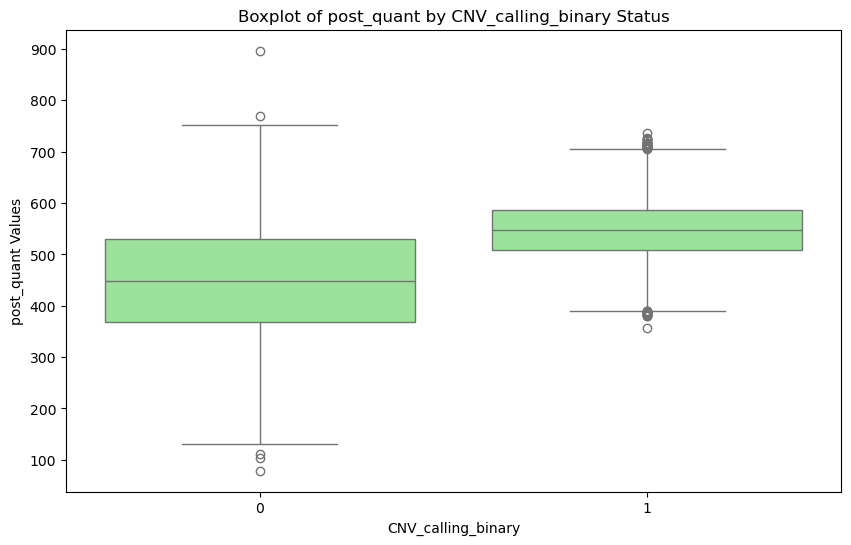

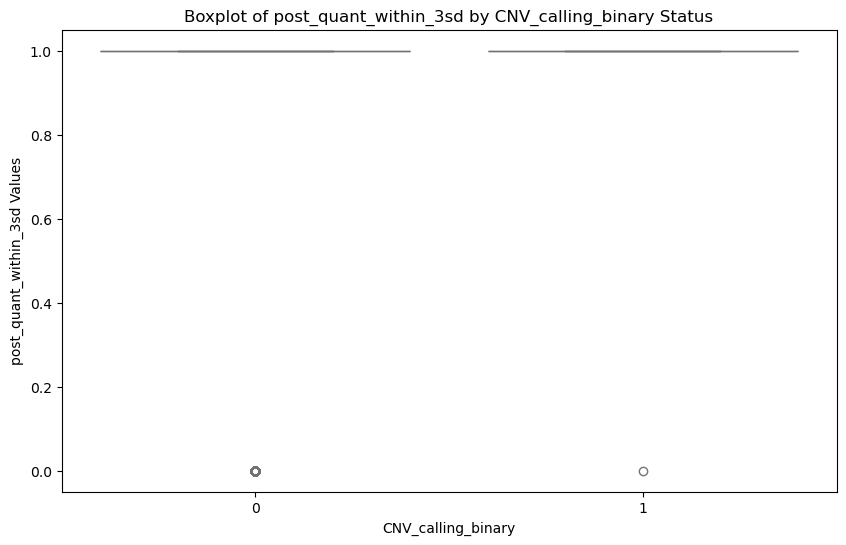

In [72]:
inputQC_predicts(df_cov_passed, ['post_quant','post_quant_within_3sd'], ['CNV_calling_binary'])

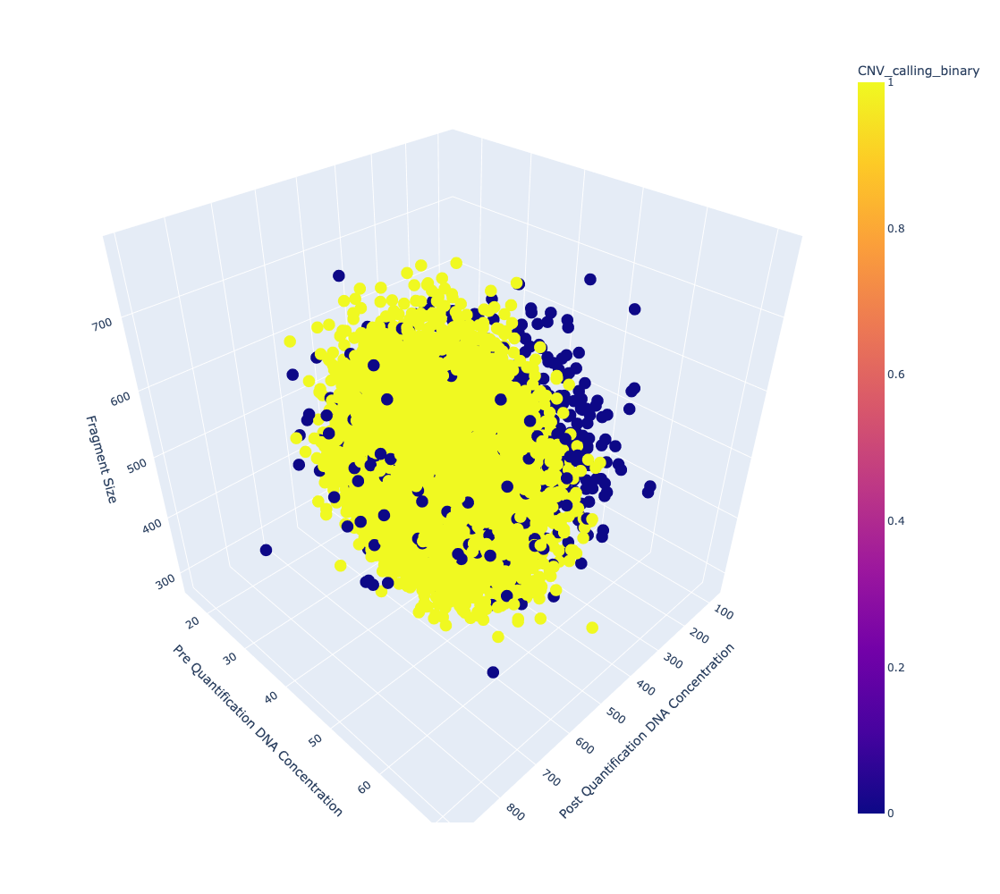

In [74]:
import plotly.express as px

fig = px.scatter_3d(
    df_cov_passed, 
    x='post_quant', 
    y='pre_quant', 
    z='frag_size', 
    color='CNV_calling_binary',  # Optional: Color based on CNV calling
    labels={
        'post_quant': 'Post Quantification DNA Concentration', 
        'pre_quant': 'Pre Quantification DNA Concentration', 
        'frag_size': 'Fragment Size'
    },
    width=1000,  # Specify width here
    height=1000  # Specify height here
)

# Show the figure
fig.show()

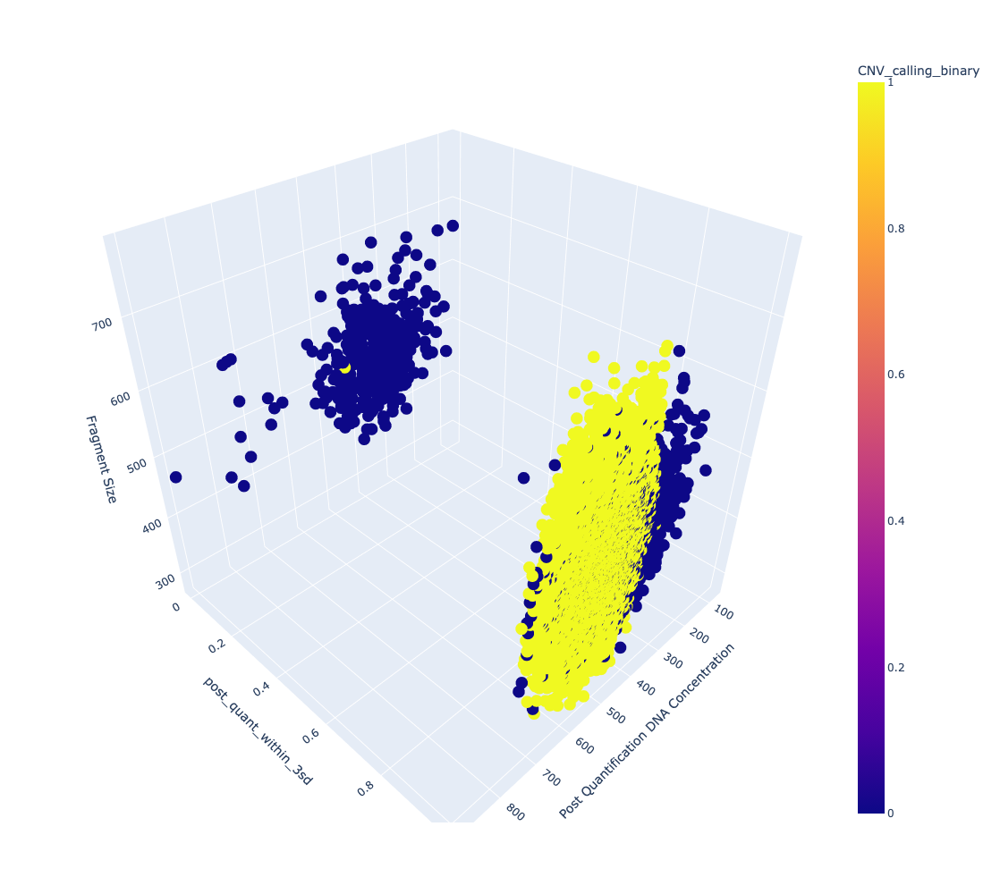

In [76]:
import plotly.express as px

fig = px.scatter_3d(
    df_cov_passed, 
    x='post_quant', 
    y='post_quant_within_3sd', 
    z='frag_size', 
    color='CNV_calling_binary',  # Optional: Color based on CNV calling
    labels={
        'post_quant': 'Post Quantification DNA Concentration', 
        'pre': 'Post_Quant Binary within 3std (1)/outside (0)', 
        'frag_size': 'Fragment Size'
    },
    width=1000,  # Specify width here
    height=1000  # Specify height here
)

# Show the figure
fig.show()

## **PART B) Have the in-process QC metrics been stable over time (note: batches are processed in numerical order)? Report your findings graphically with a figure legend.**
### The median fragment sizes of sequencing runs 89-107 are larger than the median fragment sizes of other runs before and after this period of sequencing

/var/folders/1w/f1nvvnys0db1_sj90qqds2780000gn/T/ipykernel_64781/2582029496.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




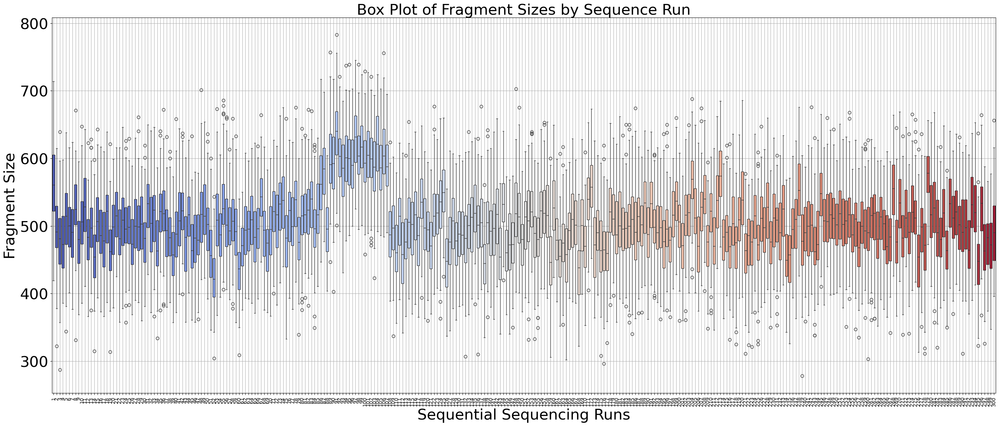

In [79]:
# Create the box plot
plt.figure(figsize=(28, 12))
sns.boxplot(x='Seq_run', y='frag_size', data=df, order=sorted(df['Seq_run'].unique()), palette='coolwarm')

# Add titles and labels
plt.title('Box Plot of Fragment Sizes by Sequence Run', fontsize=30)
plt.xlabel('Sequential Sequencing Runs', fontsize=30)
plt.ylabel('Fragment Size', fontsize=30)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.yticks(fontsize = 30)
# Show grid for clarity
plt.grid()

# Display the plot
plt.tight_layout()
#plt.savefig('Frag_size_byseqrun.png', dpi=500, bbox_inches='tight')  # Save as PNG
plt.show()

In [80]:
df_exclude = df[(df['Seq_run'] < 89) | (df['Seq_run'] > 107)]
df_before = df[(df['Seq_run'] < 89)]
df_after = df[(df['Seq_run'] > 107)]
df_fraghigh = df[(df['Seq_run'] >= 89) & (df['Seq_run'] <= 107)]

### Statistical Test to see if the difference is significant
#### The fragment size medians are signicantly different for runs 89-107 compared to the runs 1-88 and 108-300. The distributions of median for runs 1-88 and 108-300 are not significantly different from each other.

In [84]:
before_data = df_before.groupby(['Seq_run'])['frag_size'].median()
after_data = df_after.groupby(['Seq_run'])['frag_size'].median()
normal_data =  df_exclude.groupby(['Seq_run'])['frag_size'].median()
high_data = df_fraghigh.groupby(['Seq_run'])['frag_size'].median()
# Perform the independent t-test
t_statistic, p_value_befaft_or_between = stats.ttest_ind(normal_data, high_data, equal_var=False)  # Use equal_var=False for Welch's t-test
t_statistic, p_value_bef_or_between = stats.ttest_ind(before_data, high_data, equal_var=False)  # Use equal_var=False for Welch's t-test
t_statistic, p_value_aft_or_between = stats.ttest_ind(after_data, high_data, equal_var=False)  # Use equal_var=False for Welch's t-test
t_statistic, p_value_bef_or_aft = stats.ttest_ind(before_data, after_data, equal_var=False)  # Use equal_var=False for Welch's t-test

# Output the results
print(f"P-value for runs 89-107 vs. around(1-88 & 108-300): {p_value_befaft_or_between:.8f} --> Significant!")  # Format P-value to 8 decimal places
print(f"P-value before (1-88) vs. for runs 89-107: {p_value_bef_or_between:.8f} --> Significant!")  # Format P-value to 8 decimal places
print(f"P-value after (108-300) vs. for runs 89-107: {p_value_aft_or_between:.8f} --> Significant!")  # Format P-value to 8 decimal places
print(f"P-value before (1-88) vs. after (108-300): {p_value_bef_or_aft:.8f} --> NOT Significant!")  # Format P-value to 8 decimal places


P-value for runs 89-107 vs. around(1-88 & 108-300): 0.00000000 --> Significant!
P-value before (1-88) vs. for runs 89-107: 0.00000000 --> Significant!
P-value after (108-300) vs. for runs 89-107: 0.00000000 --> Significant!
P-value before (1-88) vs. after (108-300): 0.63481884 --> NOT Significant!


### The higher fragment sizes form a second small peak on the right of  the histogram below

<Axes: xlabel='frag_size', ylabel='Count'>

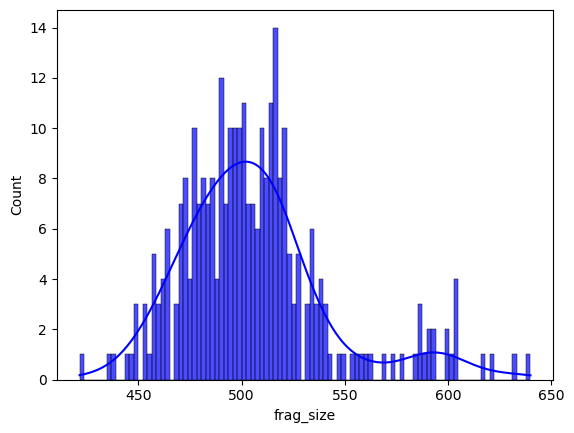

In [87]:
g = df.groupby(['Seq_run'])
y = g['frag_size'].median()
z = g['frag_size'].std()
sns.histplot(y, bins=100, color='blue', alpha=0.7, edgecolor='black', kde=True)

### When I remove the data for runs 89-107 below, the distibution of fragment sizes may be normally distributed, with a single peak and expected variation.

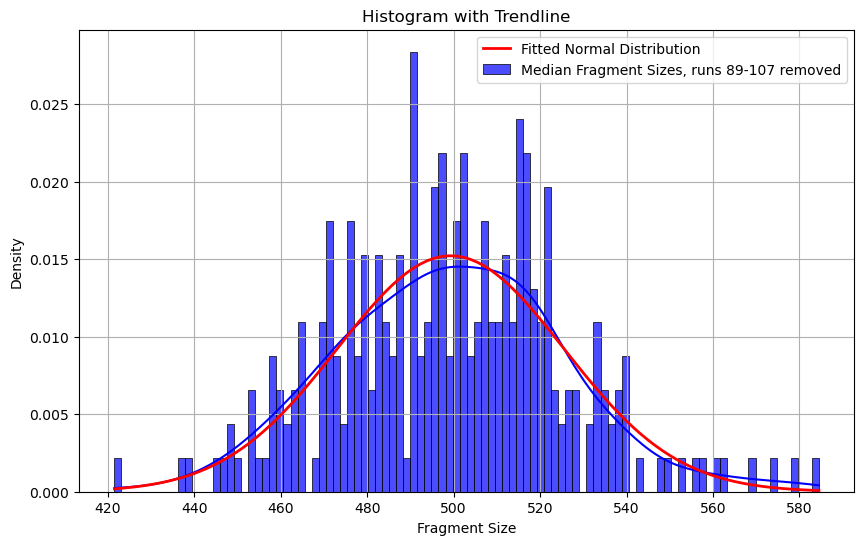

R-squared value of the Gaussian fit: 0.6526


In [95]:
g = df_exclude.groupby(['Seq_run'])
y = g['frag_size'].median()
z = g['frag_size'].std()
# Plot histogram
plt.figure(figsize=(10, 6))
#plt.hist(y, bins=100, color='blue', alpha=0.7, edgecolor='black', density=True)  # Use density=True for probability density
sns.histplot(y, bins=100, color='blue', alpha=0.7, edgecolor='black', kde=True, stat='density', label = 'Median Fragment Sizes, runs 89-107 removed')

# Fit a Gaussian; mu and sigma are the mean and standard deviation
mu, std = np.mean(y), np.std(y)

# Create an array of x values for the trendline
x = np.linspace(min(y), max(y), 100)

# Probability density function for the fitted Gaussian
pdf = norm.pdf(x, mu, std)

# Add the trendline to the plot
plt.plot(x, pdf, color='red', linewidth=2, label='Fitted Normal Distribution')

# Quality of Fit: Calculate R-squared
# Histogram counts (padded for edge cases with zeros)
hist_counts, bin_edges = np.histogram(y, bins=100, density=True)
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

# Use the PDF to get model predictions on the same x-axis
predicted_counts = pdf

# Calculate the R-squared value
ss_res = np.sum((hist_counts - predicted_counts) ** 2)  # Residual sum of squares
ss_tot = np.sum((hist_counts - np.mean(hist_counts)) ** 2)  # Total sum of squares
r_squared = 1 - (ss_res / ss_tot)

# Add labels and title
plt.xlabel('Fragment Size')
plt.ylabel('Density')
plt.title('Histogram with Trendline')
plt.legend()

# Show grid
plt.grid()

# Display the plot
plt.show()

# Print the R-squared value
print(f"R-squared value of the Gaussian fit: {r_squared:.4f}")

### The other QC metrics, post_quant and pre_quant, are stable over time. The medians vary by run which is an expected difference between experiments but there's no time specific pattern/skew for a longer length of time.

/var/folders/1w/f1nvvnys0db1_sj90qqds2780000gn/T/ipykernel_64781/2042506162.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




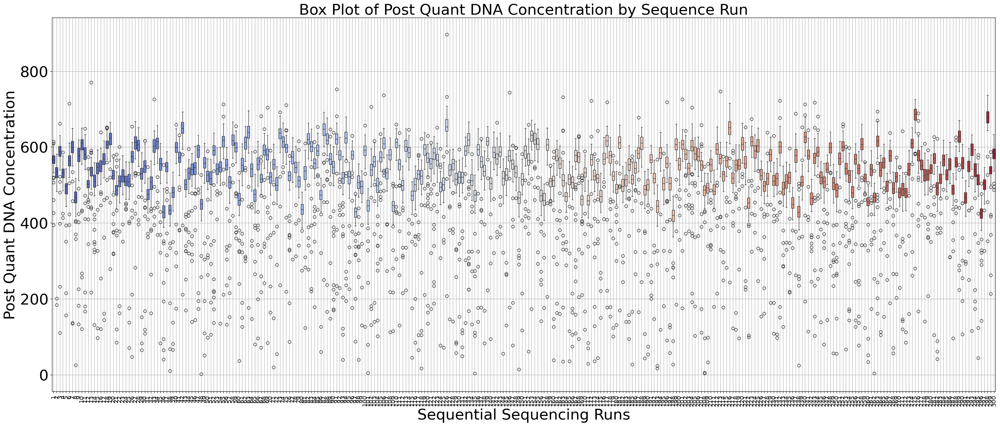

In [93]:
# Create the box plot
plt.figure(figsize=(28, 12))
sns.boxplot(x='Seq_run', y='post_quant', data=df, order=sorted(df['Seq_run'].unique()), palette='coolwarm')

# Add titles and labels
plt.title('Box Plot of Post Quant DNA Concentration by Sequence Run', fontsize=30)
plt.xlabel('Sequential Sequencing Runs', fontsize=30)
plt.ylabel('Post Quant DNA Concentration', fontsize=30)
plt.xticks(rotation=90, fontsize=12)  # Rotate x-axis labels for better readability
plt.yticks(fontsize=30)

# Show grid for clarity
plt.grid()

# Display the plot
plt.tight_layout()
plt.show()

/var/folders/1w/f1nvvnys0db1_sj90qqds2780000gn/T/ipykernel_62638/3779391935.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




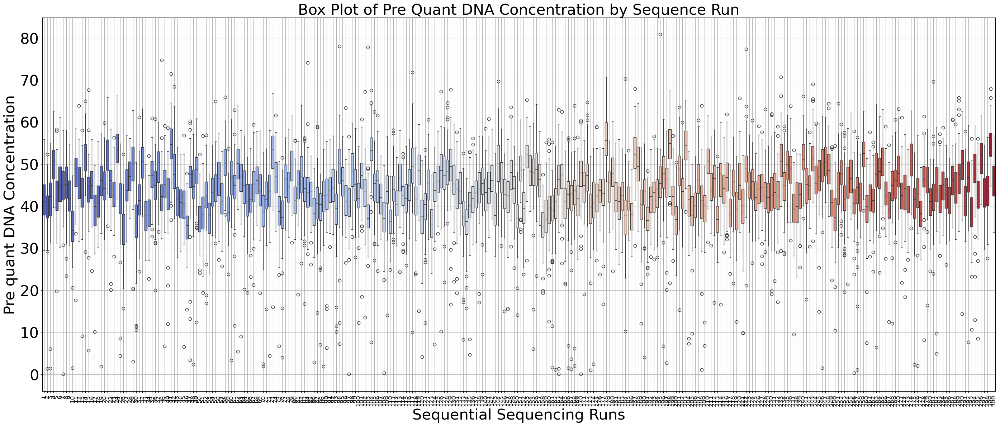

In [96]:
# Create the box plot
plt.figure(figsize=(28, 12))
sns.boxplot(x='Seq_run', y='pre_quant', data=df, order=sorted(df['Seq_run'].unique()), palette='coolwarm')

# Add titles and labels
plt.title('Box Plot of Pre Quant DNA Concentration by Sequence Run', fontsize=30)
plt.xlabel('Sequential Sequencing Runs', fontsize=30)
plt.ylabel('Pre quant DNA Concentration', fontsize=30)
plt.xticks(rotation=90, fontsize = 12)  # Rotate x-axis labels for better readability
plt.yticks(fontsize = 30)
# Show grid for clarity
plt.grid()

# Display the plot
plt.tight_layout()
plt.show()